<a href="https://colab.research.google.com/github/dalisson/IntroducaoRedesNeurais/blob/master/Introducao_a_redes_neurais_part2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Redes Neurais Artificiais

Declarações iniciais.

- O público alvo é constituído de desenvolvedores, quero dizer, apresentaremos os conceitos de maneira tão intuítiva quanto possível, mas também focamos na implementação em código.

- O conteúdo é extenso e complexo apesar dos nossos melhores esforços para simplificar tanto quanto possível, o motivo é porque se trata realmente de um conteúdo complexo e simplificar além do podemos só vai causar dano ao interessado no conteúdo.

- O notebook foi feito pensando que o interessado consiga usá-lo sem professor, por isso acrescentei comentários em cada linha importante de código e coloquei toda a explicação relevante em texto, isso nos leva a um dos pontos mais importantes.

- Não se espera que o leitor entenda todos os conceitos logo de cara, como dissemos, o notebook foi feito para ser independente de professor, então volte, reveja com calma, tente reimplementá-lo sem olhar o código.

## Redes Padrão

### Colocando em contexto

Neste ponto já conhecemos as principais "tribos" de machine learning:


> "tribo"     - área do conhecimento de origem - algoritimo principal



- Simbolistas - Filosofia e Lógica - Dedução Inversa usando árvores de decisão. 
- Bayesianos - Probablidade e estatística - Teorema de Bayes, naive bayes.
- Evolucionários - Biologia evolucionária - Algoritmo genético.
- Analogistas - Psicologia - SVM (máquina de suporte de vetores).

E hoje a última e mais badalada dos últimos tempos.
- Conectivistas - Neurociência - backpropagation, redes neurais.

\* O conceito de tribo foi retirado do livro o algoritmo mestre por Pedro Domingos, abaixo o link de uma apresentação do autor:

https://www.youtube.com/watch?v=B8J4uefCQMc&t=11s

Antes de prosseguirmos, deep learning não é puramente redes neurais:
- "[Deep learning] is not supervised learning. It’s not just neural networks. It’s basically the idea of building a system by assembling parameterized modules into a computation graph" Yann LeCun

### História

<p><img alt="Colaboratory logo" height="px" src="https://i2.wp.com/deeplearningbook.com.br/wp-content/uploads/2017/12/nn_timeline.jpg?w=2133" align="right" hspace="10px" vspace="10px"></p>

### Mark 1 Perceptron

<p><img alt="Colaboratory logo" height="px" src="https://i.pinimg.com/originals/56/8c/a8/568ca8f304df41d6d3d1d5331d4eaeba.jpg" align="right" hspace="10px" vspace="10px"></p>

### Rede Neural Padrão



Redes neurais artificais são sistemas computacionais vagamente inspirados no cérebro humano cuja função é modelar funções complexas. Para tanto elas "aprendem" a modelar sistemas através do ajuste de suas conexões.

*Uma rede neural simples possui, em geral, três camadas, o input, uma camada escondida (hidden layer) e a camada de saída, podem ser usadas tanto em tarefas de regressão (prevendo um valor contínuo, e.g. quanto um consumidor vai gastar em um site, o valor de uma casa dadas suas características) caso no qual a rede tem, em geral, um neurônio de saída, quanto para problemas de classificação cada uma das diferentes classes tem um neurônio de saída, e.g., em um problema para classificar 10 raças de cachorro teriamos 10 neurônios na ultima camada.*

Essas redes são usadas sobre dados estruturados.

Exemplo de rede neural de regressão:
- Verde : input
- azul : neurônios da camada escondida
- amarelo : neurônio de saída
- linhas : multipliplicação pelos pesos

<p><img alt="Colaboratory logo" height="px" src="https://upload.wikimedia.org/wikipedia/commons/3/3c/Neuralnetwork.png" align="right" hspace="10px" vspace="10px"></p>

#### Por que três camadas?

<h3>Teorema da aproximação universal</h3>
- Basicamente o teorema afirma que qualquer função (qualquer problema) pode ser aproximada por uma rede neural com uma única camada oculta contendo um numero finito de neurônios. Porém, existem dois problemas com esse teorema.

- Isso não significa que mais de três não faça diferença em problemas reais, ao longo das proximas aulas e durante os exercícios desta aula usaremos redes com muito mais de três camadas.

Problema um, o número finito de neurônios.
- Dizer que um número é finito não é o mesmo que dizer que ele é tratável no mundo real, o teorema nos diz apenas que o número de neurônios na camada oculta é finita, todavia, o número 43.252.003.274.489.856 também é um número finito, eleve esse número à milésima potência e ainda teremos um número finito.

Problema dois, o teorema não faz garantias sobre onde, em qual intervalo, o problema é resolvido.

- No exemplo a seguir suponha que temos os dados de treino em azul e desconhecemos o a função original, não há garantia alguma que fora do intervalo vai do primeiro ponto azul ao último o processo que originou os dados treino não tenha um comportamento totalmente imprevisto.

![alt text](https://drive.google.com/uc?id=17g3SHvKMtD8XBgdrsIV6u3cHzd1PE0Mf)

#### Ok, mas por que precisamos de uma camada oculta?

<h3>Teorema de Cover</h3>

O teorema diz que se tivermos um problema não linearmente separável em uma determinada dimensão, podemos, com grande probabilidade, torná-lo linearmente separável através da projeção em um espaço de dimensão superior.

Traduzindo se o meu problema está em um espaço 2d e não existe uma linha que separe uma classe da outra eu posso projetar esse problema em um espaço de dimensão maior e com grande probabilidade ele pode se tornar separável.

Vamos ver esse processo no vídeo abaixo, começamos em um espaço bidimensional, projetamos o problema em um espaço tridimensional e conseguimos um separador.

- Note quando vamos de 2 para 3 dimensões uma linha se torna um plano, esse é o nosso separador.

In [0]:
from IPython.display import HTML

HTML('<iframe width="560" height="315" src="https://www.youtube.com/embed/9NrALgHFwTo" frameborder="0" allow="accelerometer; autoplay; encrypted-media; gyroscope; picture-in-picture" allowfullscreen></iframe>')

Resumindo essa camada oculta serve para tornar o problema possível de ser resolvido.

### Perceptron

Célula básica da rede neural padrão. Basicamente uma multiplicação de matriz à qual uma função de ativação é aplicada.

Algoritmo:
- Entrada é multiplicada pelos termos da camada (a esses números damos o nome de pesos) em uma multiplicação de matriz padrão.
- Ao resultado um termo de bias (um número por neurônio) pode ou não ser somado, depende de como quisermos configurar a rede.
- Por aplicamos uma não linearidade, o seja, uma função de ativação que deve ser diferenciável, a mais comum é a ReLU (rectified linear unity, definida como máximo entre zero e x), embora também exista arctangente, sigmoid entre outras (o resultado desse cálculo chamamos de ativação).

Terminologia importante : 
- Uma rede neural, possui apenas dois tipos de números associados, seus parâmetros que correspondem ao termos que ela armazena e são os termos que ela aprende e as ativações, que são a computação resultante das entradas pelos pesos.


<p><img alt="Colaboratory logo" height="px" src="https://www.researchgate.net/profile/Fernando_Martins5/publication/262457514/figure/fig5/AS:392454441324548@1470579838275/Figura-6-Modelo-de-um-neuronio-artificial-de-uma-rede-MLP-Fonte-Adaptado-de-Haykin.png" align="right" hspace="10px" vspace="10px"></p>


### O algoritmo do perceptron em funcionamento (e nossa deixa para introduzir a Camada Densa)

<p><img alt="Camada_densa" height="600px"width="600px"src="https://drive.google.com/uc?id=1JAMVXPQclQOiScL_rgYIqGscPhHDOGvo" align="right" hspace="10px" vspace="10px"></p>

<h5>Exemplificando a terminologia:</h5>
<h5>A camada Z é o resultado da computação entre a entrada A e os pesos W da camada logo é uma ativação.</h5>

A camada densa é provavelmente o tipo de camada mais simples de compreender, a grosso modo é uma matriz onde o número de colunas representa a quantidade de neurônios na camada e o número de linhas deve ser compatível com a entrada pela definição de multiplicação matricial. Se utilizarmos o termo de bias, temos em conjunto um vetor cujo número de elementos é o número de neurônios da camada.
- A camada densa também é conhecida pelos nomes de fully connected (fc) e linear, esses termos tratam da mesma coisa.

## Implementação

In [0]:
%load_ext autoreload
%autoreload 2
%matplotlib inline

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


Nessa parte implementaremos duas redes usando um dos melhores frameworks da indústria, PyTorch outros frameworks conhecidos incluem keras e tensorflow, embora esses frameworks tenham sido feitos para deep learning, o processo de treino é o mesmo para redes rasas.

Vamos usar uma rede de regressão para aproximar a equação F(x) = 3x + 9, por ser um problema linear usaremos apenas uma camada, um neurônio com o termos de bias.

In [0]:
import torch
import torch.nn as nn
import numpy as np
from matplotlib import pyplot as plt

### Regressão

In [0]:
X = torch.ones((100,2))
X[:,0].uniform_(-1.,1)
# a coluna de 1 vai nos ajudar a criar a variável y
X[:5], X.shape

(tensor([[ 0.6828,  1.0000],
         [-0.9548,  1.0000],
         [ 0.9026,  1.0000],
         [ 0.1583,  1.0000],
         [ 0.5437,  1.0000]]), torch.Size([100, 2]))

In [0]:
a = torch.tensor((3.,9)); a

tensor([3., 9.])

In [0]:
#criando a variável dependente Y = 3x + 9
Y = X@a
Y[:10]

tensor([11.0484,  6.1356, 11.7077,  9.4748, 10.6312, 10.9415,  6.4657, 10.2389,
        11.8547,  9.2776])

In [0]:
#ruido aleatorio para nao ficar tão fácil
Y += torch.rand(100)

In [0]:
#agora que eu criei Y, vou jogar a coluna de 1 fora
#observe que eu quero manter a entrada como vetor coluna
X = X[:,0].unsqueeze(-1)  # mantem a entrada como um vetor coluna e joga forma a coluna de 1
X[:5], X.shape

(tensor([[ 0.6828],
         [-0.9548],
         [ 0.9026],
         [ 0.1583],
         [ 0.5437]]), torch.Size([100, 1]))

Text(0.5, 0, 'x')

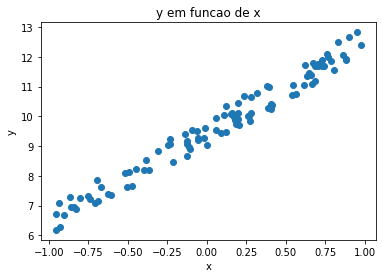

In [0]:
plt.scatter(X, Y)
plt.title('y em funcao de x');
plt.ylabel('y')
plt.xlabel('x')

Como podemos ver os nossos dados X estão armazenados em um tensor de rank 2 mas o que é um tensor?

#### Tensores

Tensor é uma daquelas coisas que parecem complicadas e na verdade é para as pessoas que estudam física, mas nos termos de redes neurais e deep learning tensor é apenas um array de tamanho regular, seu rank representa quantas dimensões ele tem.

In [0]:
#tensor de rank 2, uma matriz
rank2_tensor = torch.rand((3,2))
rank2_tensor

tensor([[0.0147, 0.5254],
        [0.1054, 0.7982],
        [0.8993, 0.0611]])

In [0]:
#tensor de rank 1, um array
rank1 = torch.rand(6)
rank1, rank1.shape

(tensor([0.3699, 0.0333, 0.3244, 0.9957, 0.3708, 0.5205]), torch.Size([6]))

O rank de um tensor de um tensor representa quanta informação precisamos para indexar um de seus itens em particular.

In [0]:
# nosso X é uma matriz uma coluna só, mas precisamos de dois numeros para indexar um elemento,
# logo, é um tensor de rank 2
X[:3], 'primeiro elemento de x: %s' % X[0][0]

(tensor([[-0.9975],
         [ 0.9619],
         [-0.2742]]), 'primeiro elemento de x tensor(-0.9975)')

In [0]:
#tensor de rank 0 é só um escalar
rank0 = torch.tensor(42)
rank0, rank0.shape

(tensor(42), torch.Size([]))

!!! Observação importante, tensores são obrigatoriamente arrays de tamanho regular, isto é, se uma das linhas de um tensor de rank 2 possui 4 elementos, todas as outras linhas obrigatoriamente possuem 4 elementos, isso é importante ao trabalhar com imagens, veremos mais sobre isso em breve.

In [0]:
#Alerta de spoiler, em visão computacional quase sempre trabalhamos com tensor de rank 4
rank4 = torch.rand((32,3,128,128))
rank4.shape #Na primeira dimensão é o batch, na segunda os canais de cor (para o pytorch) e nas outras altura e largura

torch.Size([32, 3, 128, 128])

In [0]:
#vamos tentar concatenar duas imagens de tamanhos diferentes e ver o que acontece
image1 = torch.rand((3,128,128))
print('dimensoes image1', image1.shape)
image2 = torch.rand((3,128, 256)) #imagem maior que a segunda
print('dimensoes image2', image2.shape)
#precisamos criar mais uma dimensao nessas imagens para concatenalas em um batch de tamanho 2
image1 = image1.unsqueeze(0) #cria um novo eixo na posicao zero
print('nova dimensao image1', image1.shape)
image2 = image2[None] #mesma coisa que o anterior
print('nova dimensao image2', image2.shape)

batch = torch.cat((image1, image2), dim=0)
print('dimensao do batch', batch.shape)

dimensoes image1 torch.Size([3, 128, 128])
dimensoes image2 torch.Size([3, 128, 128])
nova dimensao image1 torch.Size([1, 3, 128, 128])
nova dimensao image2 torch.Size([1, 3, 128, 128])
dimensao do batch torch.Size([2, 3, 128, 128])


#### Implementação do Treinamento

Ok, temos a variável de entrada e a variável dependente (o que queremos prever), precisamos dos outros itens para construir o loop de treinamento, precisamos de uma rede, de uma função de perda para dizer ao modelo o quão bem ele está indo(nosso erro), de um método para atualizar os pesos da rede em virtude do erro e de uma métrica para nos dizer o quão bem estamos nos saindo na tarefa.

Enumerando:

- Dados.
- Rede Neural.
- Função de perda, para dizer a rede quao bem ela está indo.
- Metodo de atualização dos pesos, o optimizador.
- Métrica para nos dizer quão bem estamos indo.
- Por fim vamos iterar sobre os dados, calculando a saída e usando a perda (loss) para optimizar o modelo.

Também vamos definir o learning_rate ou taxa de aprendizado, esse parâmetro geralmente é representado pela letra alpha, representa o quanto do erro propagaremos para os pesos, learning_rates muito altos podem colapsar a rede e em geral é necessário alterá-lo ao longo do treinamento, não nos preocuparemos com isso agora.

In [0]:
#learning_rate
lr = 1e-1

##### Implementação da Rede

Vamos definir nossa Rede Neural, em pytorch redes podem ser classes ou só funções

In [0]:
#vamos fazer a rede manualmente, a variável de entrada tem uma feature e usaremos 
# um neurônio apenas, logo a matriz de pesos da camada é 1x1, também usaremos um termo de bias
w = nn.Parameter(torch.tensor([-1.]), requires_grad=True)
bias = nn.Parameter(torch.tensor([1.]), requires_grad=True)
def rede_neural(x):
  '''
  A rede é só uma função
  '''
  return x@w + bias # o simbolo @ multiplica matrizes em pytorch a funcao de ativacao e F(x)= x

'pesos %s e bias %s' % (w.data, bias.data)

'pesos tensor([-1.]) e bias tensor([1.])'

Nossa função de ativação será F(x) = x, ou seja não vamos fazer nada com a saída, por ser um problema linear não devemos ter problema e facilita a derivada que no caso é igual a 1.

##### Função de Perda

A função de perda mais comum para regressão o MSE, minimum squared error

In [0]:
#Para a funcao de perda usaremos o mse, erro quadrado mínimo, erro = (y - y_hat)**2
def mse(y, y_hat): return ((y-y_hat)**2).mean()

Agora o método de atualização de pesos, usaremos o método do gradiente descente, os principais métodos avançados descendem de alguma forma dele.

##### Optimizador, Gradiente Descendente

O método utiliza o vetor gradiente (lembrança das aulas de cálculo), para nossos propósitos basta saber que existe o vetor gradiente, cujas componentes são as derivadas da função em relação a todas as variáveis, o interessante desse vetor é que ele sempre aponta em relação à direção de maior variação da função, então, achamos o vetor gradiente em relação à função de perda e vamos ajustar os pesos rumo ao sentido contrário, o sentido onde a perda (o erro do modelo) varia negativamente em maior intensidade.

Para propagar o erro através de multiplas camadas e ativações utilizamos a regra da cadeia (dx/dw x dloss/dw)

<p><img alt="gradiente descendente" height="400px"width="600px"src="https://miro.medium.com/max/1000/0*ZppAJQdr9FnrnrGG.jpg" align="right" hspace="10px" vspace="10px"></p>
<p> - A função do learning rate é controlar quao grande são os passos que tomamos em direção ao mínino do erro, note que se o passo for muito grande passariamos do mínimo e da melhor solução.</p>
<p> - Note também que a medida que nos aproximamos do mínimo queremos dar passos mais curtos para conseguir justo no melhor ponto, por isso costumamos ajustar o lr ao longo do treinamento, não fazemos isso aqui porque é uma tarefa muito fácil.</p>

In [0]:
#Logico que no mundo real e nos problemas que nos intessam o espaço de otimização é bem mais complexo, em muitas situações
#não conseguimos chegar ao mínimo global

<p><img alt="gradiente descendente" height="400px"width="600px"src="https://miro.medium.com/max/699/1*mElyetzsTIJrNnKI8kTkCw.jpeg" align="right" hspace="10px" vspace="10px"></p>

No nosso caso usaremos o gradiente descendente estocástico SGD na sigla em inglês. Estocástico porque no Gradiente Descendente cálculamos o erro corrigimos o peso depois de uma passada completa por todas as amostras, na prática isso é incrivelmente demorado e inviável, então fazemos um compromisso, passamos um batch de amostras, ou seja uma determinada quantidade, dependendo de quanto o computador aguenta por vez (em geral 32 ou 64 em tarefas com imagens) calculamos o erro e propagamos a correção pela rede. Nessa tarefa em particular faremos o tamanho do batch igual a 1 algo que frequentemente chamado tarefa de aprendizagem online.

Em situações normais não vamos nos preocupar em calcular derivadas, o autograd do pytorch mantém o rastro de como as coisas são calculadas e calcula a derivada para nós, precisamos apenas ativar essas função através do parâmetro requires_grad = True, teriamos feito isso se nao fossemos fazer tudo manual, algumas células atrás. Todavia, vamos fazer manualmente as coisas e esquecer o autograd no primeiro exercício.

##### Métrica

Como métrica vamos simplesmente olhar para o erro também. Mas ressaltamos a diferença entre métrica e função de perda, a métrica serve para o data scientist avaliar seu trabalho a função de perda é usada para ajustar o modelo. Agora sim, para o loop de treinamento.

##### Loop de Treinamento

Vamos iterar sobre os dados e fazer o procecimento de treino:
<P>Algoritmo:</P>
- Calcular F(x) para x.
- Calcular o erro para saber quao distante estamos da solução
- Calcular as derivadas, para ter o gradiente.
- Usar o gradiente para atualizar os parâmetros da rede.
- Repetir até ter o melhor resultado que consigmos ou número de iterações for grande o bastante.

In [0]:
#vamos fazer duas epochs
#epoch é a passagem completa por todos os dados de treinamento
def treinar_rede():
  for epoch in range(2):
    t = 0
    for x, y in zip(X,Y):
      y_hat = rede_neural(x)
      loss = mse(y, y_hat)
      t += 1
      if t % 10 == 0: print('erro', loss.detach().numpy())
      loss.backward()
      #derivadas calculadas manualmente

      dedw = -2*x*(y-y_hat) #em relacao ao peso
      dedbias = (-2*(y-y_hat)) # em relacao ao bias

      #Vamos verificar se o gradiente calculado manualmente é igual ao calculado pelo pytorch
      #como eles sao iguais usaremos o pytorch de agora em diante
      if t %100 == 0:
        print('\nverificando gradiente')
        print('gradiente de w automatico', w.grad.detach().numpy(), '| nosso calculo', dedw.detach().numpy())
        print('gradiente de bias automatico',bias.grad.detach().numpy(), '| nosso calculo', dedbias.detach().numpy())
        print()
      #temos que zerar manualmente a acumulação dos gradientes do torch
      #apesar de nao os estarmos usando na tarefa
      w.grad.zero_()
      bias.grad.zero_()
      with torch.no_grad():
        #ajuste dos parâmetros
        w.sub_(lr * dedw)
        bias.sub_(lr * dedbias)

In [0]:
treinar_rede()

erro 1.8604735
erro 0.76898825
erro 0.098839685
erro 0.12680727
erro 0.0060157673
erro 0.022247683
erro 0.004438716
erro 0.15526986
erro 0.18396401
erro 0.29824358

verificando gradiente
gradiente de w automatico [0.7878814] | nosso calculo [0.7878814]
gradiente de bias automatico [1.0922337] | nosso calculo [1.0922337]

erro 0.051870853
erro 0.092088625
erro 0.0048438427
erro 0.081344545
erro 0.028055457
erro 0.029104175
erro 0.010232584
erro 0.16007523
erro 0.18124501
erro 0.3007979

verificando gradiente
gradiente de w automatico [0.79124814] | nosso calculo [0.79124814]
gradiente de bias automatico [1.0969009] | nosso calculo [1.0969009]



In [0]:
#parâmetros depois de ajustados, lembre-se que eles foram inicializados em -1 e +1
w, bias

(Parameter containing:
 tensor([2.9513], requires_grad=True), Parameter containing:
 tensor([9.4794], requires_grad=True))

<H3>O que implementamos é a famosa Adaline o perceptron cuja função de ativaçao é F(x) = x, o Madaline, primeira rede utilizada para resolver problema do mundo real (e ainda em serviço) nada mais é do que o Adaline multicamada.</H3>

<h4>Agora que implementamos as coisas na mão, vamos usar as camadas prontas do Pytorch.</h4>

<h4>A seguir vamos implementar uma rede multicamada para classificação, mas antes vamos ver nosso treinamento em progresso.</h4>
<h4>A rede que implementaremos se chama MLP, multilayer perceptron em bom português, perceptron multicamada, a diferença para o Madaline é que usaremos uma função de ativação chamada ReLU, essa é a função de ativação mais utilizada.

##### Vamos ver o treinamento em progresso

In [0]:
#Mesmo treinamento utilizando funções no torch
#note que agora estamos fazendo o Gradiente descendentes, passamos todos os dados pela rede e depois calculamos a perda e depois atualizamos os pesos
def treinamento():
      y_hat = rede_neural(X)
      loss = mse(Y, y_hat)
      loss.backward()
      with torch.no_grad():
        #ajuste dos parâmetros
        w.sub_(lr * w.grad)
        bias.sub_(lr * bias.grad)
        w.grad.zero_()
        bias.grad.zero_()

In [0]:
#animacao com matplotlib
from matplotlib import animation, rc
rc('animation', html='jshtml')

In [0]:
#reiniciando os pesos
w = nn.Parameter(torch.tensor([-1.]),requires_grad=True)
bias = nn.Parameter(torch.tensor([1.]),requires_grad=True)

fig = plt.figure()
plt.scatter(X, Y, c='orange')
line, = plt.plot(X, rede_neural(X).detach().numpy())
plt.close()

def animate(i):
    treinamento()
    line.set_ydata(rede_neural(X).detach().numpy())
    return line,

animation.FuncAnimation(fig, animate, np.arange(0, 100), interval=20)

In [0]:
w, bias

(Parameter containing:
 tensor([-0.0001], requires_grad=True), Parameter containing:
 tensor([7.3262], requires_grad=True))

### Classificação

##### Vamos preparar os dados

Vamos conseguir os dados.

In [0]:
# n amostras de duas features
n = 400
X_input = (torch.rand((n, 2)) > 0.5).type(torch.FloatTensor)
Y_input = (X_input[:,0] != X_input[:,1]).type(torch.LongTensor)
X_input += (torch.rand(n,2).normal_() * 0.04)
X_input[:8], Y_input[:8]

(tensor([[ 8.8813e-01,  1.7619e-02],
         [ 1.0397e+00,  1.0250e+00],
         [-3.6294e-04,  1.0188e+00],
         [ 3.1220e-06, -4.2700e-02],
         [-2.2588e-02,  1.1035e+00],
         [ 9.8032e-01,  9.9253e-01],
         [ 9.4647e-01,  1.0330e+00],
         [-2.6721e-02,  2.8560e-02]]), tensor([1, 0, 1, 0, 1, 0, 0, 0]))

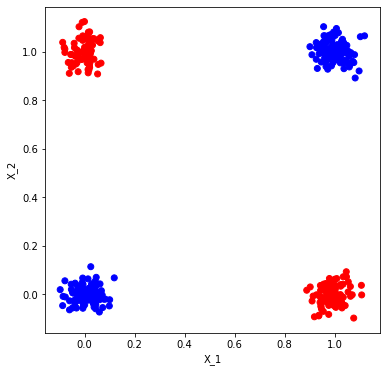

In [0]:
#Esse codigo nao importa, e so python normal
plt.figure(figsize=(6,6))
plt.scatter(X_input[:,0], X_input[:,1], c=[(lambda x : 'red' if x > 0 else 'blue') (x) for x in Y_input])
plt.xlabel('X_1')
plt.ylabel('X_2')
plt.show()

Ficar trabalhando com X e Y separados é problemático e pode dar problema, vamos aproveitar a situação e organizar um dataset.

- Em pytorch os datasets herdam da classe Dataset e precisam necessariamente sobrescrever dois metodos \_\_getitem__ e \_\_len__



In [0]:
from torch.utils.data import Dataset

class XORDataset(Dataset):
  
  def __init__(self, X,Y):
    super(XORDataset, self).__init__()
    #o componente tem que falhar se tivermos numero diferente de dados e labels
    assert len(X) == len(Y)
    self.X = X
    self.Y = Y
    
  def __len__(self):
    return len(self.X)
  
  def __getitem__(self, i):
    return self.X[i], self.Y[i]

In [0]:
#instanciando nossos datasets
n_dados_treino = (n//100) * 90 
dataset_treino = XORDataset(X_input[:n_dados_treino], Y_input[:n_dados_treino])
dataset_teste = XORDataset(X_input[n_dados_treino:], Y_input[n_dados_treino:])
#so pra tester se ta funcionando
len(dataset_treino), len(dataset_teste)

(360, 40)

Agora que temos datasets, vamos criar dataloaders, basicamente um dataloader carrega os dados contidos no dataset, vamos criar dois, um pra treino e um pra teste.

In [0]:
from torch.utils.data import DataLoader

In [0]:
dataloader_treino = DataLoader(dataset=dataset_treino, batch_size=64, shuffle=True)
dataloader_teste = DataLoader(dataset=dataset_teste, batch_size=64, shuffle=False)
#de novo testar se funcinou
#next(iter(dataloader_treino))[:3], next(iter(dataloader_teste))

##### Rede Neural

Vamos usar as camadas do torch, a camada densa se chama linear, vamos usar outra função de ativação dessa vez a ReLU definida como max(0, entrada) e por último a camada de softmax.

A softmax é necessária em tarefas de classificação.

- Ela transforma a entrada em uma função de distribuição de probabilidade, traduzindo, o vetor que entram nela passaa a ter valor de 0 a 1, que representa a probabilidade de ser cada classe probalidade e se voce somá-los o resultado da 1.

Na verdade utilizamos sempre o logaritmo da softmax, felizmente o pytorch também tem isso implementado para nós, chama-se LogSoftmax.



Softmax

<p><img alt="gradiente descendente" height="400px"width="600px"src="https://miro.medium.com/max/2482/1*hwdjtUG2pv8EhuxcR4mWmA.png" align="right" hspace="10px" vspace="10px">

<p> - Note que temos 3 classes, as probabilidades somam para um e cada probabilidade individual é maior que zero (isso é o significado de função de distribuição de probabilidade).</p>
<p> - Para transformar a softmax em log softmax é só tirar o logaritmo natural de cada um desses resultados da softmax, e.g., log(0.7) = -0.356.</p>

In [0]:
#primeiro vamos listar as camada que vamos usar
#basicamente a entrada de duas features vai para ser projetada em uma camada escondida de 3 neuronios e pela funcao de ativação ReLU
#depois vai para a camada de saida para classificação entre duas classes 1 ou 0
camadas = [nn.Linear(2, 3, bias=True), nn.ReLU(), nn.Linear(3,2, bias=True), nn.LogSoftmax(dim=1)]

<p><img alt="Rede de classificacao" height="400px"width="600px"src="https://drive.google.com/uc?id=1RjY40I-4aHDXAU-44DhU_n57Ir3ZlRiz"align="right" hspace="10px" vspace="10px">
<p> Nossa nova rede </p>

In [0]:
#vamos olhar dentro da camada linear
exemplo_linear = nn.Linear(2, 3, bias=True)
exemplo_linear.weight, exemplo_linear.bias

(Parameter containing:
 tensor([[-0.1046, -0.2614],
         [-0.6771, -0.5389],
         [-0.1436,  0.3788]], requires_grad=True), Parameter containing:
 tensor([-0.5547, -0.6804,  0.5887], requires_grad=True))

In [0]:
#vamos encapsular as camadas em uma classe
# a hora ideal para aprender mais sobre python e seus dunders
import torch.nn as nn
class RedeNeural(nn.Module):

  def __init__(self, camadas):
    self.camadas = camadas

  def __call__(self, x):
    '''
    dunder call, permite chamar a classe como funcao
    '''
    for camada in self.camadas:
      x = camada(x)
    return x
  
  def __repr__(self):
    '''
    dunder repr da a representacao da classe quando fazemos print
    '''
    nomes = 'entrada->'
    for camada in self.camadas:
      nomes += camada.__repr__() + '->'
    return nomes + 'saida'
  
  def parameters(self):
    '''
    retornar os parametros que serao treinados
    '''
    parametros = []
    for camada in self.camadas:
      if hasattr(camada, 'parameters'):
        parametros.append(camada.parameters())
    
    return parametros


rede = RedeNeural(camadas=camadas)

print(rede)

entrada->Linear(in_features=2, out_features=3, bias=True)->ReLU()->Linear(in_features=3, out_features=2, bias=True)->LogSoftmax()->saida


In [0]:
#só pra teste
batch_teste, _ = next(iter(dataloader_treino))
#podemos usar a rede como uma funcao porque implementamos o dunder __call__
rede(batch_teste)

Métodos com a assinatura \_\_metodo__ são chamados de dunders, ou double unders, eles são muito importantes e definem comportamentos em python, deixamos para o estudante uma lista com exemplos de outros dunders de interesse, obviamente,  não é uma lista exaustiva:
- \_\_enter\__
- \_\_exit__
- \_\_iter__
- \_\_len__
- \_\_del__

<h4>Tivemos que implementar um monte de coisas na classe atual, seria bom se o pytorch tivesse essas coisas implementadas para nós.</h4>

Pytorch tem uma classe chamada Module, no módulo nn, essa classe contém um monte de coisas úteis implementadas e é sempre a base das redes neurais.
Vamos reescrever a classe RedeNeural, dessa vez com herança.

In [0]:
class RedeNeural(nn.Module):

  def __init__(self, camadas):
    super(RedeNeural, self).__init__()
    for i, camada in enumerate(camadas):
      #essa função registra a camada dentro da classe
      #o primeiro parametro é onde o modulo vai ser registrada, o segundo o nome do modulo e terceiro o modulo em si 
      nn.Module.add_module(self, 'camada_%s' %i, camada) 

  def forward(self, x):
    '''
    Pela documentação precisamos sobreescrever esse metodo, na verdade __call__ da classe mae chama esse metodo
    '''
    for camada in self.children():
      x = camada(x)
    return x

rede = RedeNeural(camadas=camadas)

!importante até mesmo as camadas da rede herdam de nn.Module

In [0]:
nn.Linear.__bases__

(torch.nn.modules.module.Module,)

In [0]:
rede

RedeNeural(
  (camada_0): Linear(in_features=2, out_features=3, bias=True)
  (camada_1): ReLU()
  (camada_2): Linear(in_features=3, out_features=2, bias=True)
  (camada_3): LogSoftmax()
)

Mais simples, podemos colocar as camadas dentro da classe sem precisar de passar por lista, nesse caso, sao automaticamente registradas dentro da classe como módulos

In [0]:
class RedeNeural(nn.Module):

  def __init__(self, input_size, hidden_size, output_size):
    super(RedeNeural, self).__init__()
    self.camada_escondida = nn.Linear(input_size, hidden_size, bias=True)
    self.func_ativacao = nn.ReLU(inplace=True)
    self.camada_saida = nn.Linear(hidden_size, output_size, bias = True)
    self.log_softmax = nn.LogSoftmax(dim=-1)

  def forward(self, x):
    '''
    Pela documentação precisamos sobreescrever esse metodo, na verdade __call__ da classe mae chama esse metodo
    '''
    for camada in self.children():
      x = camada(x)
    
    return x

rede = RedeNeural(2,3,2)
rede

RedeNeural(
  (camada_escondida): Linear(in_features=2, out_features=3, bias=True)
  (func_ativacao): ReLU(inplace=True)
  (camada_saida): Linear(in_features=3, out_features=2, bias=True)
  (log_softmax): LogSoftmax()
)

<h4>Isso ainda é coisa demais para nós, nosso modelo é muito simples só 4 camadas em sequencia, o pytorch tem uma coisa menor com as mesmas funcionalidades anteriores para modelos em sequencia.</h4>

In [0]:
rede = nn.Sequential(*camadas)
rede

Sequential(
  (0): Linear(in_features=2, out_features=3, bias=True)
  (1): ReLU()
  (2): Linear(in_features=3, out_features=2, bias=True)
  (3): LogSoftmax()
)

Agora que temos a rede vamos pegar o optimizador do pytorch

##### Optimizador

De novo o gradiente descendente, dessa vez o do próprio Pytorch. Vamos passar os parametros da rede para ele.

In [0]:
from torch.optim import SGD
optimizador = SGD(params=rede.parameters(), lr=2e-2, momentum=0.9)

###### Função de perda

Nossa função de perda padrão para classificação é NLLoss, não discutiremos em detalhes a matemática por trás, mas basicamente ela usa o negativo da saída da camada log_softmax do modelo para computar a perda.
- Fato interessante, a junção de log_softmax com nllloss se chama cross_entropy poderiamos ter pego ela direto se nao tivessemos incluido a camada de logsoftmax no nosso modelo.

<p><img alt="NLLLoss" height="400px"width="600px"src="https://i.imgur.com/hU252jE.jpg" align="right" hspace="10px" vspace="10px">

In [0]:
from torch.nn import NLLLoss
criterion = NLLLoss()

##### Métrica

Dessa vez nossa metrica vai ser a acurácia, pytorch nao tem por default, vamos ter que definir a função nós mesmos. Basicamente queremos a procentagem de vezes em que a previsão é igual à classe real.



In [0]:
def acuracia(y_hat, y):
  prediction = torch.max(y_hat, dim=-1)[-1]
  return (prediction == y).type(torch.FloatTensor).mean().detach().numpy()

###### Agora vamos treinar o modelo

In [0]:
#reinstanciando as coisas, notebook costuma dar problema de sobreescrever as coisas importantes
camadas = [nn.Linear(2, 3, bias=True), nn.ReLU(), nn.Linear(3,2, bias=True), nn.LogSoftmax(dim=1)]
rede = nn.Sequential(*camadas)
optimizador = SGD(params=rede.parameters(), lr=2e-2, momentum=0.9)

In [0]:
def update_func( x, y, is_eval=False):
  y_hat = rede(x)
  # se estivermos em avaliacao nao vamos calcular erro ou atualizar parametros
  if is_eval:
    return acuracia(y_hat, y)
  #calcula o erro
  loss = criterion(y_hat, y)
  #propaga o gradiente pela rede
  loss.backward()
  #atualiza os parametros
  optimizador.step()
  #zera os gradientes
  optimizador.zero_grad()
  return loss

In [0]:
n_epochs = 500
for epoch in range(n_epochs):
  optimizador.zero_grad()
  losses = 0
  accs = 0
  iteracoes = 0
  #coloca a rede em modo de treino
  rede.train()
  for x, y in dataloader_treino:
    loss = update_func(x, y, is_eval=False)
    iteracoes += 1
    losses += loss.detach().numpy()
  losses = losses/iteracoes 
  #coloca a rede em modo de teste
  rede.eval()
  iteracoes = 0
  for x, y in dataloader_teste:
    acc = update_func(x, y, is_eval=True)
    iteracoes += 1
    accs += acc
  accs = accs/iteracoes 
  if epoch % 200 == 0:
    print('loss', losses, 'acc', accs)

loss 0.9175936778386434 acc 0.4749999940395355
loss 0.005091209663078189 acc 1.0
loss 0.0021718981054921946 acc 1.0
loss 0.0013669347390532494 acc 1.0
loss 0.0009818088437896222 acc 1.0
loss 0.0007725431545016667 acc 1.0
loss 0.0006318208373462161 acc 1.0
loss 0.0005348283739294857 acc 1.0
loss 0.0004613146932873254 acc 1.0
loss 0.00040495320960568887 acc 1.0
loss 0.0003650757425930351 acc 1.0


###### Vamos visualizar o espaço de separacao

In [0]:
x_grid = torch.arange(-0.2,1.2, 0.02)
grid = torch.tensor([[x, y] for x in x_grid for y in x_grid])
space_label = torch.max(rede(grid), dim=-1)[-1]

NameError: ignored

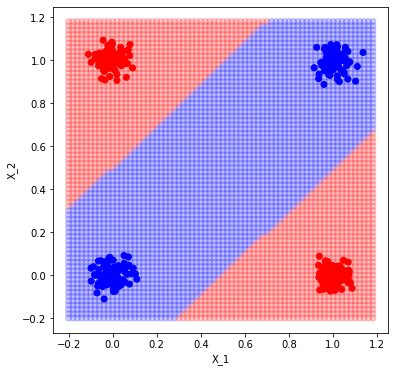

In [0]:
plt.figure(figsize=(6,6))
plt.scatter(grid[:,0], grid[:,1], c= [(lambda x: 'blue' if x == 0 else 'red')(x) for x in space_label], alpha=0.2, marker = 'o')
plt.scatter(X_input[:,0], X_input[:,1], c=[(lambda x : 'red' if x > 0 else 'blue') (x) for x in Y_input])
plt.xlabel('X_1')
plt.ylabel('X_2')
plt.show()

##### Visualizar o processo de treinamento

In [0]:
def update_func( x, y, is_eval=False):
  y_hat = rede(x)
  loss = criterion(y_hat, y)
  loss.backward()
  optimizador.step()
  optimizador.zero_grad()

In [0]:
from matplotlib import animation, rc
rc('animation', html='jshtml')

In [0]:
camadas = [nn.Linear(2, 3, bias=True), nn.ReLU(), nn.Linear(3,2, bias=True), nn.LogSoftmax(dim=1)]
rede = nn.Sequential(*camadas)
optimizador = SGD(params=rede.parameters(), lr=2e-2, momentum=0.9)


space_label = torch.max(rede(grid), dim=-1)[-1]
c = [(lambda x: 'blue' if x == 0 else 'red')(x) for x in space_label]


fig = plt.figure()
plt.scatter(X_input[:,0], X_input[:,1], c=[(lambda x : 'red' if x > 0 else 'blue') (x) for x in Y_input])
scatter = plt.scatter(grid[:,0], grid[:,1], alpha=0.2, c=c, marker = 'o')
plt.close()

def animate(i):
    for x, y in dataloader_treino:
      update_func(x, y, is_eval=False)
    space_label = torch.max(rede(grid), dim=-1)[-1]
    c = [(lambda x: 'blue' if x == 0 else 'red')(x) for x in space_label]
    scatter.set_color(c)
    return scatter,

animation.FuncAnimation(fig, animate, np.arange(0, 100), interval=20)

Link interessante para visualizar o treinamento em problemas toy: https://playground.tensorflow.org/

## Deep Learning

Aqui começamos com deep learning, existem diversos tipos de aquitetura específicas para tratar de diferentes problemas, começaremos com problemas de visão computacional (eg. identificar objetos a partir de imagem) antes de passarmos para problemas que envolvem dados em sequência como previsão de séries temporais.

### CNN, Convolutional Neural Networks, ou simplesmente, redes neurais convolucionais

Para começar com deep learning vamos tratar das redes convolucionais a arquitetura utilizada para resolver problemas de visão computacional.

- Sabemos que imagens são compostas de pixels e cada pixel tem um valor numérico associado a ele, na verdade uma imagem colorida de 128 x 128 pode ser vista como uma matriz de tres camadas (red, green and blue), ou para usar o que já aprendemos um tensor de rank 3.

Vamos focar em imagens preto e branco no momento por simplicidade (com um canal apenas), veremos que a transição para imagens coloridas vai ser muito simples.
- Observação: ainda é um tensor de rank 3, mas em vez de termos 128 x 128 x 3, temos 128 x 128 x 1, esse eixo de canais tem sempre que existir, cuidado ao utilizar bibliotecas que abrem imagens preto e branco sem ele (PIL e skimage fazem isso), se ele não estiver lá precisamos inserir o eixo, em torch usamos o método .unsqueeze('posicao_do_eixo') para fazê-lo.

Vamos pensar como lidar com imagens usando a arquitetura de três camadas que aprendemos. Mas como vamos passar um objeto de duas dimensoes (ou mesmo tres se fossem imagens coloridas) pela rede.

Uma opção é achatar a imagem, transformar cada imagem em um vetor com todos os números em sequencia, uma imagem de 128 x 128 x 1 seria entao um vetor de 1 x 16384. Vamos fazer exatamente isso com uma imagem 3 x 4 e observar o processo. 

![alt text](https://drive.google.com/uc?id=1C_2UthlKsypslmb0eJr3zN0RT8vY2u96)

- Voçê consegue identificar o numeral na imagem da esquerda?
- E na imagem da direita?

Lembre-se que pelo funcionamento de uma camada Linear a entrada é multiplicada por todos os neurônios, daí o outro nome que é dado a essa camada fully connected (totalmente conectada).

Aqui vemos o problema da técnica, jogamos fora a informação de posição dos pixels. Essa informação é importante e precisamos mantê-la. Precisariamos de um modo de que um neurônio veja apenas parte da imagem e de forma organizada.

Então, como vamos resolver o problema?

### Convolução e a camada convolucional

A camada de convolução consiste em uma janela movel de tamanho arbitrário que é deslizada através da imagem, tal janela, chamada de kernel, contém os parâmetros que serão aprendidos pela rede e associado a cada kernel podemos ter ou não um termo de bias. A imagem é multiplicada por esses parametros, o resultado é somado e sobre esse resultado é aplicada a função de ativação, como anteriormente ReLU é quase sempre a função de ativação escolhida.

Exemplo de kernel 3x3

![alt text](https://miro.medium.com/max/464/0*1uXqmRo35hI4fqYg.jpg)

Basicamente cada vez que o processo de multiplicação ocorre, seguido da soma e função de ativação corresponde a um neurônio da rede, observe que nesse processo cada neurônio "vê" apenas uma parte da imagem (os pixels de uma certa região da imagem, isso permite que façamos computação sobre uma imagem e mantenhamos a informação espacial.

Para uma demostração da operação recomendamos o site:

https://setosa.io/ev/image-kernels/

- Vamos agora configurar uma camada em pytorch

In [0]:
from torch.nn import Conv2d

camada = Conv2d(in_channels=3, out_channels=9,kernel_size=(3,3), stride=(1,1), padding=(1,1), bias=True, padding_mode='zeros')

In [0]:
#vamos olhar dentro da camada de Convolucao
camada_exemplo = Conv2d(in_channels=3, out_channels=2,kernel_size=(3,3), stride=(1,1), padding=(1,1), bias=True, padding_mode='zeros')
camada_exemplo.weight

Parameter containing:
tensor([[[[ 0.1243, -0.1304, -0.0841],
          [ 0.1877, -0.0487,  0.0703],
          [-0.0236, -0.1485,  0.1288]],

         [[-0.0816, -0.1286, -0.0033],
          [ 0.0333,  0.0025,  0.1043],
          [ 0.1664,  0.0621, -0.0730]],

         [[-0.1057, -0.1650,  0.0344],
          [ 0.0453,  0.0571, -0.0081],
          [ 0.1055, -0.0104, -0.0454]]],


        [[[-0.1172, -0.1077, -0.0948],
          [ 0.0782,  0.0692, -0.1726],
          [-0.0623,  0.0558,  0.1819]],

         [[ 0.0259,  0.0528, -0.1018],
          [-0.1074,  0.1214, -0.0770],
          [-0.1029,  0.1504,  0.1511]],

         [[ 0.0075,  0.1321, -0.1212],
          [-0.1811, -0.0572,  0.1383],
          [ 0.1483, -0.1899,  0.1368]]]], requires_grad=True)

In [0]:
camada_exemplo.bias

Parameter containing:
tensor([-0.1818, -0.1387], requires_grad=True)

Explicando os parâmetros:

- in_channels = quantidade de canais na entrada da camada
- out_channels = quantos canais terá a saída, em outras palavras, quantos canais a camada produzirá com a entrada.
- kernel_size = tamanho da janela altura e largura em pixels, note que se a janela ficar maior que a entrada em algum ponto da rede teremos um erro.
- stride = Ao deslizar a janela quantos pixels vamos saltar por vez na horizontal e na vertical, nada impede que esses numeros sejam diferentes.
- padding = podemos adicionar valores ao redor da imagem para que o resultado da camada não tenha dimensoes de largura e altura diferentes da entrada, esse parâmetro determina quantos pixels adicionaremos.
- bias = se queremos ou não um termo de bias associado aos kernels.
- padding_mode = se fizermos padding qual a estratégia, a mais comum adiciona zeros às bordas.

Só por diversão, vamos fazer convolução em uma imagem.

##### Exemplo de convolução

In [0]:
#vamos baixar uma imagem
import requests
pic_url = "https://lh3.googleusercontent.com/proxy/TsyHY7nIwsUbnAPbRBnpi6U5Zjrsyqdf2hb_EH9oSTvJZmpl5oFJz8hmZVX8Z0nxiiHhfR0pxzTZ4ipcw37rxWyGl-0uvfHft77m17o"

#Esse comportamento de with é permitdo para classes que tem __enter__ implementado
with open('dog.jpg', 'wb') as handle:
        response = requests.get(pic_url, stream=True)
        
        if not response.ok:
            print(response)

        for block in response.iter_content(1024):
            if not block:
                break
            handle.write(block)

(512, 384, 3)


(<matplotlib.image.AxesImage at 0x7fca1c10fda0>, None)

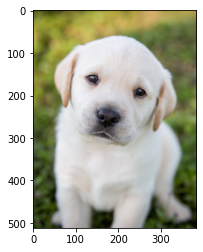

In [0]:
#le a imagem e devolve em formato de numpy
from skimage.io import imread
dog_img = imread('dog.jpg')
plt.imshow(dog_img), print(dog_img.shape)

In [0]:
#pytorch precisa da informação de canal de cor no primeiro eixo

dog_img = np.transpose(dog_img, axes=(2,0,1))
dog_img.shape

(3, 512, 384)

In [0]:
img_as_tensor = torch.from_numpy(dog_img).type(torch.FloatTensor)
img_as_tensor.shape

torch.Size([3, 512, 384])

In [0]:
#a camada de convolução opera sobre tensor de rank 4, o primeiro eixo recebe a informação
#de batch, como temos uma imagem vamos só adicionar um eixo ao tensor
img_as_tensor = img_as_tensor.unsqueeze(0)
img_as_tensor.shape

torch.Size([1, 3, 512, 384])

In [0]:
img_as_tensor.dtype

torch.float32

In [0]:
from torch.nn import Conv2d
minha_camada = Conv2d(in_channels=3, out_channels=1,kernel_size=(3,3), stride=(1,1), padding=(1,1), bias=True, padding_mode='zeros')

In [0]:
resultado = minha_camada(img_as_tensor)
resultado.shape

torch.Size([1, 1, 512, 384])

In [0]:
#removendo o eixo de batch e voltando a imagem para numpy
resultado = resultado.squeeze(0).detach().numpy()

(<matplotlib.image.AxesImage at 0x7fca19bfc828>, (512, 384))

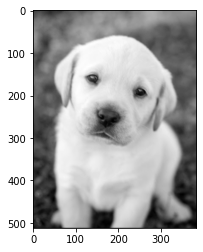

In [0]:
#tem que remover o eixo cor para plotar imagem preto e branco
resultado = resultado.squeeze(0)
plt.imshow(resultado, cmap='gray'), resultado.shape

###### Agora é sua vez, mas o faça com uma imagem preto e branco para testar, o download já está pronto para você, lembre-se de verificar a quantidade de eixos após abrir a imagem e que a camada de convolução funciona para tensor de rank 4

In [0]:
#vamos baixar uma imagem
import requests
pic_url = "https://raw.githubusercontent.com/utkuozbulak/singular-value-decomposition-on-images/master/data/grayscale_cat.jpg"

#Esse comportamento de with é permitdo para classes que tem __enter__ implementado
with open('cat.jpg', 'wb') as handle:
        response = requests.get(pic_url, stream=True)
        
        if not response.ok:
            print(response)

        for block in response.iter_content(1024):
            if not block:
                break
            handle.write(block)

In [0]:
from skimage.io import imread
cat_img = imread('cat.jpg')

(<matplotlib.image.AxesImage at 0x7fca19b4bc88>, (400, 600))

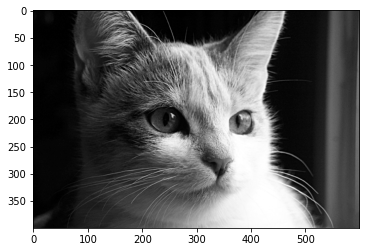

In [0]:
plt.imshow(cat_img, cmap='gray'), cat_img.shape

In [0]:
#use o metodo shape para verificar os canais de cor

In [0]:
#se necessario adicione o canal de cor

In [0]:
#transforme em tensor, lembre que imagens em pytorch tem a informacao de canal de cor a frente das dimensoes de tamanho e largura
#se necessario use o metodo de numpy para transpor a imagem antes

In [0]:
#verifique novamente as dimensoes e adicione um canal para transformar em tensor de rank 4

In [0]:
#instancie uma camada de convoluçao

In [0]:
#faca a convolução os canais de cor de saida fica a seu criterio, mas lembre-se que se quiser visualizar precisa que seja um canal ou 3

In [0]:
#se quiser conferir o resultado transforme em numpy remova o eixo de batch e qualquer outra que seja necessário

#### Camada de Pooling

Vamos aproveitar o momento e introduzir a camada de pooling, esse é um tipo de camada muito simples, o pooling 2d significa usar uma janela deslizante ao longo da imagem com a diferenca que o maior numero dentro do patch e o resultado cada vez que deslizamos se estivermos fazendo max_pooling, ou o resultado pode ser a media entre os numeros dentro do patch, no caso de average pooling. 

.Max Pooling 2d, a janela deslizante é o patch em vermelho, a saída é a matriz de 4 números.
<p>Note que o stride da janela é 2.</p>

![alt text](https://peltarion.com/static/2d_max_pooling_pa1.png)

Outra opção de pooling é fazer o cálculo ao longo da dimensão de canais ou seja, se temos 512 canais e fazemos max pooling, escolhemos o maior número de cada canal e o resultado é um vetor de 512 elementos, isso é comum ao final das camadas de convoluções em tarefas de classificação, onde precisamos de um vetor de tamanho fixo ao final das convoluções para usar em uma camada densa.

### A Rede Convolucional

Basicamente uma rede convolucional é constituída por múltiplas camadas convolucionais, os parâmatros de números de canais, tamanho do kernel e stride são controlados para reduzir o tamanho da saída ao longo da rede (em geral o número de canais dobra a medida que as dimensões da entrada são reduzidos pela metade), o procedimento visa que a rede aprenda a extrair uma hierarquia de características importantes da imagem ao longo das múltiplas camadas, ao final das convoluções, em tarefas de classificação, em geral fazemos algum tipo de pooling ao longo dos canais, o resultado é o vetor de características da imagem, esse vetor é usado então como a entrada para uma rede padrão, nossa conhecida amiga, a camada densa. 

O objetivo da parte convolucional da rede é extrair o vetor de características da imagem, tornando-a em dado estruturado. Anteriormente ao deep learning esse processo de criação de algoritmo de extração era manual, exigia estudo no campo específico da tarefa e dificilmente poderia ser usado em outro campo, a rede convolucional usa o aprendizado de máquina para automatizar a extração isso é o que as tornou tão revolucionárias em visão computacional.
<p> Imagine que estivessemos trabalhando na tarefa de identificar raças de cães através de imagens, sem deep learning teriamos que trabalhar em pesquisa para extrair características importantes para discernir entre as diferentes raças, o processo poderia levar meses ou mesmo anos para descobrirmos quais features são interessantes e como extraí-las algoritmicamente, ao fim, se depois tivessemos a tarefa de identificação de falante por voz dificilmente usariamos algo da nossa pesquisa anterior e começariamos do zero.</p>


Terminologia importante:
*   É comum chamar a parte convolucional da rede de encoder. 



A seguir mostramos o funcionamento de uma resnet (uma das arquiteturas mais queridas da indústria), temos convolucoes ate a camada 4 (o diagrama é uma simplificação, na verdade cada camada é composta por múltiplas convoluções), note que com uma exceção o número de canais aumenta quando as dimensões são cortadas pela metade, na camada 4, em geral, fazemos o pooling de cada canal e o resultado é o vetor na camada flatten, que contem 512 números, a partir daí o dado é tratado como dado estruturado e segue para nossa já conhecida camada densa.

A rede de classificacao é um encoder seguido pelo MLP que aprendemos.

![alt text](https://miro.medium.com/max/1872/1*Y-u7dH4WC-dXyn9jOG4w0w.png)

### Resnet Completa

A seguir a resnet 34 completa, o tamanho da imagem é reduzido onde vemos a linha pontilhada.


<p>Rotacionamos a mesma imagem em 180 graus. Se trata de um 6 ou de um 9?</p>
<img id="image_canv" src="https://storage.googleapis.com/kaggle-datasets-images/6978/10038/d9e74a548a8cdca167b38520ac8bf405/data-original.png?t=2017-12-13-20-32-53" width="3500px">

### Dificuldades de treinamento

<p>Treinar redes neurais profundas nao e tarefa facil, varios problemas surgem a medida que a profundidade aumenta, entre os principais problemas temos os gradientes que podem ficar muito pequenos quando sao propagados do final ate o inicio da rede ou gradientes ficando muito grandes em determinadas ocasioes e destruindo os parametros da nossa rede.</p>
<p>No comeco redes muito profundas costumavam nao ter mais que 8 camadas, hoje elas passam de 100 (ate mil em um paper especifico), uma das principais invensoes que possibilitou treinar redes tao profundas foi o desenvolvimento das Resnets que incorporam o bloco residual, apesar de uma discussao profunda dessas redes estar alem do escopo desta aula e importante saber de sua existencia e que se possivel vale a pena optar por essas redes.</p>


### A camada de Batchnorm

Uma camada que é de extrema importancia para treinar redes profundas é a camada de BatchNorm.
<p> Apesar de a matemática ser um tanto complexa para a explicar essa camada a fundo o que é importante saber sobre ela é que sempre que possível queremos usá-la, colocando uma camada após cada camada de convolucao ou densa.</p>
<p>Seu único ponto negativo e que, como o nome diz, ela depende que o processo de treinamento use batches (mais de um exemplo por passada no treinamento) se beneficiando de batches maiores e nao funciona em treinamento online onde o batch tem tamanho 1.</p>
<p>Essa camada é uma das que possuem funcionamento diferente durante treinamento e durante a previsão, embora nao possa ser usada para treinar com batch de tamanho 1 ele funciona perfeitamente durante a predicao.</p>

A seguir a implementacao da resnet em pytorch, note que sempre ha uma camada de batchnorm apos cada camada convolucional.

In [0]:
#Importando a resnet, esse modulo possui varias arquiteturas prontas, como as densenets que sao uma variacao da resnet
#alem de resnets de profundidades variadas, vamos observar a de tamanho 34, mais informacoes na documentacao oficial do pytorch
from torchvision.models import resnet34
modelo = resnet34(pretrained=True)

Downloading: "https://download.pytorch.org/models/resnet34-333f7ec4.pth" to /root/.cache/torch/checkpoints/resnet34-333f7ec4.pth


In [0]:
#como sempre, em pytorch um modelo pertence a classe nn.Module, essa classe implementa __repr__ como jeito facil de inspecionar suas camadas internas
modelo

Por fim, vamos tratar de um assunto pertinente a todas as redes de neurais. Falaremos de Transfer Learning.

### Técnicas Importantes em Deep Learning

#### Transfer Learning

Quando no codigo acima importamos a rede, utilizamos o parâmetro pretrained = True. O significado disso é que estamos utilizando uma rede que foi pretreinada em conjunto de dados chamado imagenet, a imagenet é uma base de dados composta por milhares de categorias com milhares de exemplos de cada, frameworks como o pytorch disponibilizam as arquiteturas com pesos já treinados nessa base.
<p>A vantagem disso é que podemos aproveitar uma rede que já passou muito tempo treinando e já aprendeu coisas que podem nos ser interessantes, utilizar pre treinamento pode inclusive nos ajudar a contornar limitações como um conjunto pequeno de dados, ao utilizar conhecimento já adquirido em outro dataset.</p>
<p> Todavia, nem tudo são flores. Ao utilizar transfer learning precisamos considerar se a tarefa para a qual a rede foi originalmente treinada faz sentido para o nosso caso.<p>
<p> Considere um exemplo, a imagenet é composta de categorias como cachorro, peixe, gato, casa, portanto faz perfeito sentido utilizar uma rede pretreinada nesse conjunto e ajustá-la a uma tarefa como prever a que raça um cao pertence, posto a similiridade entre os objetos reais encontrados na imagenet e os objetos da nossa tarefa, objetos reais possuem forma com curvas, arestas entre outros.</p>
<p>Por outro lado pode não ser uma boa ideia utilizá-la quando a nossa tarefa for reconhecer um falante através do espectograma da voz, uma imagem de espectograma não traz a muita semelhança a objetos do mundo real.<p>
<p>No final recomendamos bom senso e experimentação na utilização da técnica, transferir conhecimento indiscriminadamente pode não ser benéfico.</p>

#### Data Augmentation

Data Augmentation consiste na ideia de utilizar transformacoes sobre os dados de treino para obter o que na visao da rede neural constituem novos dados.

Por exemplo aumentar a exposicao e contraste em uma imagem, embora do ponto de vista humano possa nao parecer diferente, no ponto de vista das ativacoes de uma rede neural constituem um exemplo totalmente diferente, em outras palavras, o uso inteligente dessa tecnica e praticamente equivalente a conseguir dados novos de graca.

Exemplo de augmentation em uma imagem, aqui cada uma das 15 imagens resultanes representa algum tipo de augmentation, rotacao, translacao, tambem poderiam usar random crop na imagem, o importante e notar que, do ponto de vista da rede neural, cada imagem constitui um exemplo diferente contribuindo para o aprendizado do modelo.

Pytorch possui uma classe enorme de transformações prontas, para mais informações recomendamos olhar a documentação oficial em https://pytorch.org/docs/stable/torchvision/transforms.html

![alt text](https://miro.medium.com/max/1684/1*uwnaDjYuMuYyVK0m-5RcjQ.png)

Novamente essa técnica não deve ser utilizada de maneira indiscriminada. Imagine se rotacionarmos o 6 da imagem.


<img id="image_canv" src="https://encrypted-tbn0.gstatic.com/images?q=tbn%3AANd9GcQFqfHff5IG80GOJqgck31aoa8Sbd2MA71ADVmIqs42rNn4pwBh&usqp=CAU" height="200px">
<p>Rotacionamos a mesma imagem em 180 graus. Agora se trata de um 6 ou de um 9?</p>
<img id="image_canv" src="https://drive.google.com/uc?id=1BZYD5yEzRZ4g6om5zsHPb3ReW4apwATV" height="200px">


Via de regra, se após o augmentation a imagem nao faz sentido para você tao pouco o fara para a rede.

Data augmentation e uma area de pesquisa em redes neurais e temos muitos pesquisadores dedicados a tarefa de descobrir que tipo de transformacao faz sentido em que tipo de tarefa.